In [87]:
pip install lime

In [88]:
import pandas as pd
df = pd.read_csv("/content/shuffled_merged_file.csv")
df.head()

,id,title,description,label
0,1437435,kernel HID integer underflow in cpreportfixup...,An integer underflow flaw was found in the way...,1
1,815679,software error shows when searching certs with...,NaN,0
2,570145,kms:rv635:hd3650 external dvi monitor corrupti...,NaN,0
3,584473,summary: selinux is preventing /usr/libexec/a...,summary: selinux is preventing /usr/libexec/ab...,0
4,1761146,OpenJDK Excessive memory allocation in CMap w...,It was discovered that the CMap class in the 2...,1


In [89]:
# Data Analysis
import pandas as pd
import numpy as np

# Data Visualization
from matplotlib import pyplot as plt
import seaborn as sns

# Machine Learning
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,auc, precision_score, recall_score, roc_auc_score, roc_curve, confusion_matrix,f1_score
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

# NLP
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from wordcloud import WordCloud, STOPWORDS
import re

# Warning
import warnings
warnings.filterwarnings('ignore')

Train and Test CSV files

In [90]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Load your CSV file into a pandas DataFrame
data = pd.read_csv("/content/shuffled_merged_file.csv")

# Split the data into features (X) and target variable (y) assuming the last column is the target variable
X = data.iloc[:, :-1]  # Features
y = data.iloc[:, -1]   # Target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Concatenate features and target variable for training and testing sets
train_data = pd.concat([X_train, y_train], axis=1)
test_data = pd.concat([X_test, y_test], axis=1)

# Save the training and testing data to CSV files
train_data.to_csv("train.csv", index=False)
test_data.to_csv("test.csv", index=False)


In [91]:
# Loading train data
train_df = pd.read_csv('/content/train.csv')
print(f'Train data shape: {train_df.shape}')
train_df.head()

Train data shape: (11491, 4)


,id,title,description,label
0,593696,empty list of simple_allow_users causes sssd s...,+++ this bug was initially created as a clone ...,0
1,605962,"selinux is preventing /usr/bin/python ""connect...",summary: selinux is preventing /usr/bin/python...,0
2,585329,crash in calibre-0.6.42-1.fc12: process /usr/b...,abrt 1.0.8 detected a crash. architecture: x86...,0
3,567686,"selinux is preventing /bin/rm ""unlink"" access ...","summary: selinux is preventing /bin/rm ""unlink...",0
4,1546886,bugzilla CSRF in reportcgi allows to extract ...,A flaw was found in Bugzilla Bugzilla 216rc1 t...,1


In [92]:
# Loading test data
test_df = pd.read_csv('/content/test.csv')
print(f'Test data shape: {test_df.shape}')
test_df.head()

Test data shape: (2873, 4)


,id,title,description,label
0,1484840,php various flaws fedoraall,This is an automatically created tracking bug...,1
1,605710,make mdadm udev rules honor noiswmd cmdline op...,"hi, the new incremental mdraid assembly rules ...",0
2,1454303,asterisk Multiple security issues epel6,This is an automatically created tracking bug...,1
3,1707768,ImageMagick denial of service in ReadXWDImage...,ReadXWDImage in codersxwdc in the XWD image pa...,1
4,566128,segfault in _int_free iff gcc-debuginfo presen...,created attachment 394712 [details] no-op java...,0


In [93]:
# Duplicates check
train_df.duplicated().sum()

0

In [94]:
# Data types check
train_df.dtypes

id             object
title          object
description    object
label           int64
dtype: object

In [95]:
# Missing values check
print(f'Missing values in train data:\n{train_df.isnull().sum()}')
print('-'*40)
print(f'Missing values in test data:\n{test_df.isnull().sum()}')

Missing values in train data:
id                0
title            99
description    1352
label             0
dtype: int64
----------------------------------------
Missing values in test data:
id               0
title           22
description    341
label            0
dtype: int64


In [96]:
import pandas as pd

# Assuming you have already loaded your train and test DataFrames as train_df and test_df

# Remove missing values from the train DataFrame
train_df = train_df.dropna()

# Remove missing values from the test DataFrame
test_df = test_df.dropna()

# Check if missing values are removed
print(f'Missing values in train data after removal:\n{train_df.isnull().sum()}')
print('-'*40)
print(f'Missing values in test data after removal:\n{test_df.isnull().sum()}')

Missing values in train data after removal:
id             0
title          0
description    0
label          0
dtype: int64
----------------------------------------
Missing values in test data after removal:
id             0
title          0
description    0
label          0
dtype: int64


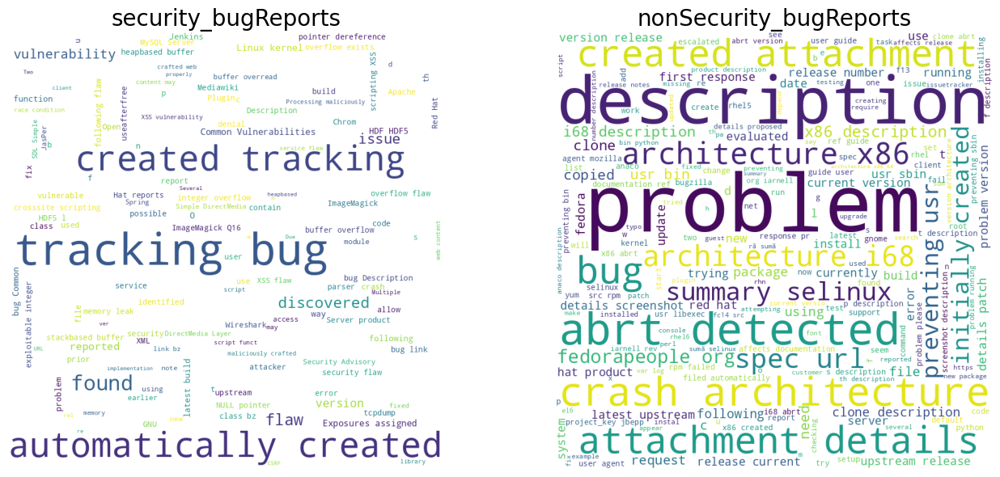

In [97]:
# Plotting wordclouds
stopwords = set(STOPWORDS)

security_bugReports = train_df['description'][train_df['label']==1].to_string()
wordcloud_negative = WordCloud(width = 800, height = 800,
                               background_color ='white', stopwords = stopwords,
                               min_font_size = 10).generate(security_bugReports)

nonSecurity_bugReports = train_df['description'][train_df['label']==0].to_string()
wordcloud_positive = WordCloud(width = 800, height = 800,
                               background_color ='white', stopwords = stopwords,
                               min_font_size = 10).generate(nonSecurity_bugReports)

# Plotting the WordCloud images
plt.figure(figsize=(14, 6), facecolor = None)

plt.subplot(1, 2, 1)
plt.imshow(wordcloud_negative)
plt.axis("off")
plt.title('security_bugReports', fontdict={'fontsize': 20})

plt.subplot(1, 2, 2)
plt.imshow(wordcloud_positive)
plt.axis("off")
plt.title('nonSecurity_bugReports', fontdict={'fontsize': 20})

plt.tight_layout()
plt.show()

Data Preprocessing

In [98]:
# Train-Test Splitting
X = train_df.drop(columns=['label'])
y = train_df['label']
test = test_df
print(X.shape, test.shape, y.shape)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=10)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(10057, 3) (2512, 4) (10057,)
(8045, 3) (2012, 3) (8045,) (2012,)


In [99]:
X_train.dtypes

id             object
title          object
description    object
dtype: object

Text Normalization

In [100]:
# Function to tokenize and clean the text
def tokenize_and_clean(text):
    # Changing case of the text to lower case
    lowered = text.lower()

    # Cleaning the text
    cleaned = re.sub('@user', '', lowered)

    # Tokenization
    tokens = word_tokenize(cleaned)
    filtered_tokens = [token for token in tokens if re.match(r'\w{1,}', token)]

    # Stemming
    stemmer = PorterStemmer()
    stems = [stemmer.stem(token) for token in filtered_tokens]
    return stems

**Vectorization**

In [101]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [102]:
# BOW Vectorization

# TF-IDF Vectorization
tfidf_vectorizer = TfidfVectorizer(tokenizer=tokenize_and_clean, stop_words='english')
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train['description'])
X_test_tfidf = tfidf_vectorizer.transform(X_test['description'])
print(X_train_tfidf.shape, X_test_tfidf.shape)

# TF-IDF Vectorization on full training data
tfidf_vectorizer_full = TfidfVectorizer(tokenizer=tokenize_and_clean, stop_words='english')
X_tfidf = tfidf_vectorizer_full.fit_transform(X['description'])
test_tfidf = tfidf_vectorizer_full.transform(test['description'])
print(X_tfidf.shape, test_tfidf.shape)

(8045, 50091) (2012, 50091)
(10057, 59451) (2512, 59451)


**SMOTE**

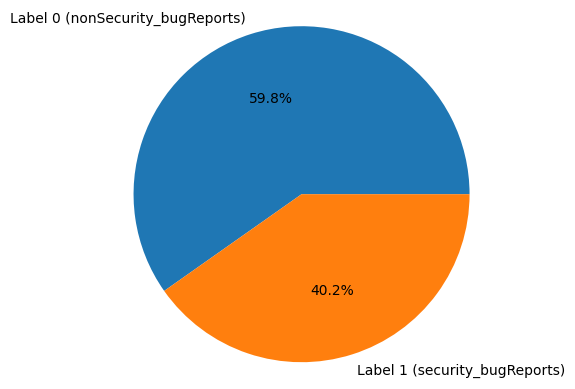

In [103]:
# Class Imbalance Check
plt.pie(y_train.value_counts(),
        labels=['Label 0 (nonSecurity_bugReports)', 'Label 1 (security_bugReports)'],
        autopct='%0.1f%%')
plt.axis('equal')
plt.show()

(9616, 50091) (9616,)
(12040, 59451) (12040,)


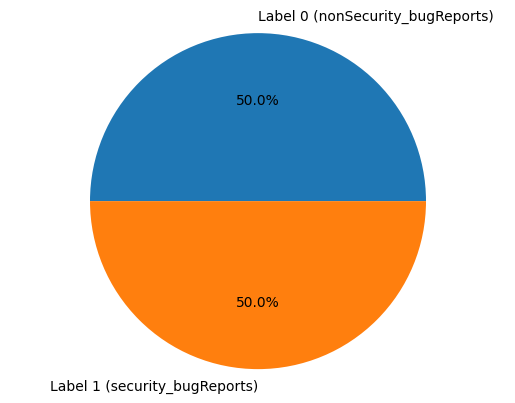

In [104]:
# SMOTE to deal with the class imbalance
smote = SMOTE()
X_train_smote, y_train_smote = smote.fit_resample(X_train_tfidf, y_train.values)
print(X_train_smote.shape, y_train_smote.shape)

# SMOTE on full training data
smote = SMOTE()
X_smote, y_smote = smote.fit_resample(X_tfidf, y.values)
print(X_smote.shape, y_smote.shape)

# Class Imbalance Check
plt.pie(pd.value_counts(y_train_smote),
        labels=['Label 0 (nonSecurity_bugReports)', 'Label 1 (security_bugReports)'],
        autopct='%0.1f%%')
plt.axis('equal')
plt.show()

ML **Modeling**

In [105]:
# Functions to print scores
def training_scores(y_act, y_pred):
    acc = round(accuracy_score(y_act, y_pred), 3)
    precision = round(precision_score(y_act, y_pred), 3)
    recall = round(recall_score(y_act, y_pred), 3)
    f1 = round(f1_score(y_act, y_pred), 3)
    roc_auc = round(roc_auc_score(y_act, y_pred), 3)
    print(f'Training Scores: Accuracy={acc}, precision={precision}, recall={recall}, F1-Score={f1}, roc={roc_auc}')

def validation_scores(y_act, y_pred):
    acc = round(accuracy_score(y_act, y_pred), 3)
    precision = round(precision_score(y_act, y_pred), 3)
    recall = round(recall_score(y_act, y_pred), 3)
    f1 = round(f1_score(y_act, y_pred), 3)
    roc_auc = round(roc_auc_score(y_act, y_pred), 3)
    print(f'Validation Scores: Accuracy={acc}, precision={precision}, recall={recall}, F1-Score={f1}, roc={roc_auc}')

In [106]:
# Logistic Regression
lr = LogisticRegression()
lr.fit(X_train_smote, y_train_smote)
y_train_pred = lr.predict(X_train_smote)
y_test_pred = lr.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=0.986, precision=0.999, recall=0.973, F1-Score=0.986, roc=0.986
Validation Scores: Accuracy=0.976, precision=0.981, recall=0.959, F1-Score=0.97, roc=0.973


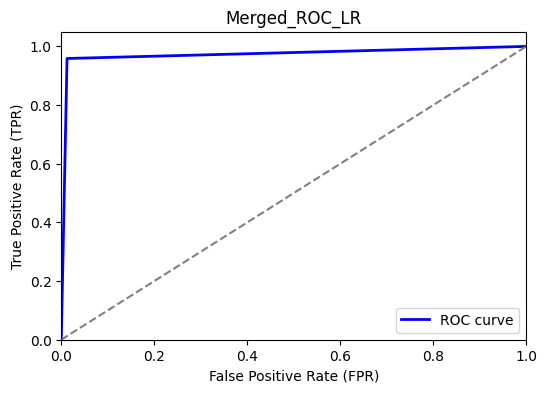

In [107]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Merged_ROC_LR')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Merged_ROC_LR.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

--------------------------**LIME for Logistic Regression**----------------------

In [108]:
from lime.lime_text import LimeTextExplainer
class_names = list(train_df.label.unique())
explainer = LimeTextExplainer(class_names=class_names)

In [109]:
max_features = train_df.description.str.split().map(lambda x: len(x)).max()
print(max_features)

1744


In [110]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, lr)

In [111]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

675


In [112]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.63140669 0.36859331]]

Explanation as a list of weighted features


[('list', -0.11691591047429085),
 ('py', -0.0610791845266224),
 ('browser', 0.0362614066349019),
 ('crash', 0.03267478186594894),
 ('2', -0.008064329582060175)]

In [113]:
[test.title.iloc[idx]]

['crash in setroubleshoot-server-2.2.83-1.fc13: browser.py:618:notify_button_clicked:indexerror: list index out of range']

In [114]:
exp.show_in_notebook(text=True)

In [115]:
# Naive Bayes Classifier
mnb = MultinomialNB()
mnb.fit(X_train_smote, y_train_smote)
y_train_pred = mnb.predict(X_train_smote)
y_test_pred = mnb.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=0.969, precision=0.999, recall=0.939, F1-Score=0.968, roc=0.969
Validation Scores: Accuracy=0.967, precision=0.989, recall=0.926, F1-Score=0.957, roc=0.96


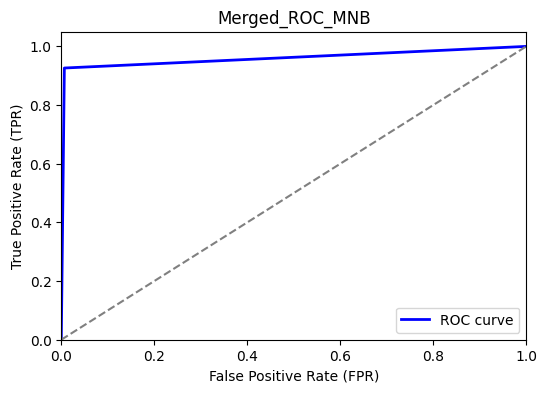

In [116]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Merged_ROC_MNB')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Merged_ROC_MNB.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

--------------------------**LIME for Naive Bayes**----------------------

In [117]:
from lime.lime_text import LimeTextExplainer
class_names = list(train_df.label.unique())
explainer = LimeTextExplainer(class_names=class_names)

In [118]:
max_features = train_df.description.str.split().map(lambda x: len(x)).max()
print(max_features)

1744


In [119]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, mnb)

In [120]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

675


In [121]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.86005194 0.13994806]]

Explanation as a list of weighted features


[('list', -0.10642712170083277),
 ('py', -0.06506874021718802),
 ('indexerror', -0.05797132373564834),
 ('server', 0.03601466026533281),
 ('index', -0.0331997190112693)]

In [122]:
[test.title.iloc[idx]]

['crash in setroubleshoot-server-2.2.83-1.fc13: browser.py:618:notify_button_clicked:indexerror: list index out of range']

In [123]:
exp.show_in_notebook(text=True)

In [124]:
# Random Forest Classifier
rf = RandomForestClassifier()
rf.fit(X_train_smote, y_train_smote)
y_train_pred = rf.predict(X_train_smote)
y_test_pred = rf.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=1.0, precision=1.0, recall=1.0, F1-Score=1.0, roc=1.0
Validation Scores: Accuracy=0.975, precision=0.976, recall=0.961, F1-Score=0.969, roc=0.973


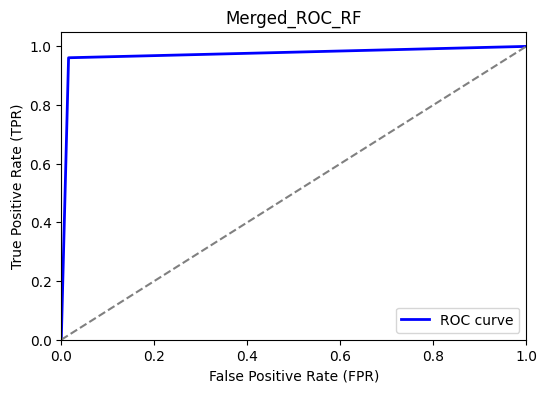

In [125]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Merged_ROC_RF')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Merged_ROC_RF.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

----------------------**lime for Random Forest Classifier**---------------------

In [126]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, rf)

In [127]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

675


In [128]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.35 0.65]]

Explanation as a list of weighted features


[('list', -0.24005370870268727),
 ('crash', -0.08184470791986395),
 ('py', -0.016675449982600482),
 ('browser', 0.007399908303864145),
 ('index', 0.0062677910799496615)]

In [129]:
[test.title.iloc[idx]]

['crash in setroubleshoot-server-2.2.83-1.fc13: browser.py:618:notify_button_clicked:indexerror: list index out of range']

In [130]:
exp.show_in_notebook(text=True)

In [131]:
# Extreme Gradient Boosting Classifier
xgb = XGBClassifier(objective='binary:logistic', eval_metric='logloss')
xgb.fit(X_train_smote, y_train_smote)
y_train_pred = xgb.predict(X_train_smote)
y_test_pred = xgb.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=0.996, precision=1.0, recall=0.992, F1-Score=0.996, roc=0.996
Validation Scores: Accuracy=0.972, precision=0.971, recall=0.959, F1-Score=0.965, roc=0.97


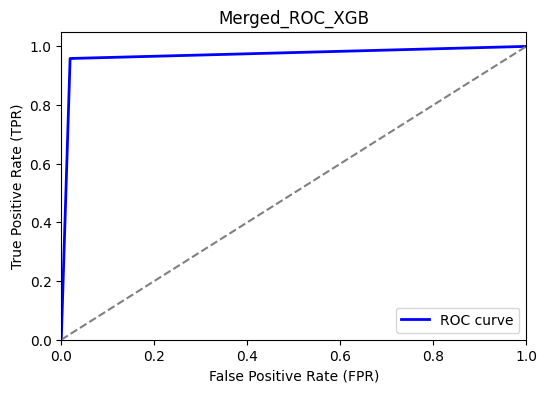

In [132]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Merged_ROC_XGB')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Merged_ROC_XGB.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

---------------------**lime for Extreme Gradient Boosting**---------------------

In [133]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, xgb)

In [134]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

675


In [135]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.5920017  0.40799835]]

Explanation as a list of weighted features


[('crash', 0.0),
 ('in', 0.0),
 ('setroubleshoot', 0.0),
 ('server', 0.0),
 ('2', 0.0)]

In [136]:
[test.title.iloc[idx]]

['crash in setroubleshoot-server-2.2.83-1.fc13: browser.py:618:notify_button_clicked:indexerror: list index out of range']

In [137]:
exp.show_in_notebook(text=True)

In [138]:
pip install lime

**SMOTE WITH 60:40 RATIO**

(8173, 50091) (8173,)
(12040, 59451) (12040,)


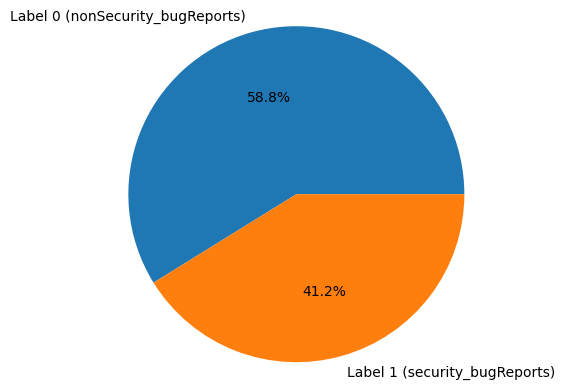

In [139]:
# SMOTE to deal with the class imbalance
smote = SMOTE(sampling_strategy=0.7)
X_train_smote, y_train_smote = smote.fit_resample(X_train_tfidf, y_train.values)
print(X_train_smote.shape, y_train_smote.shape)

# SMOTE on full training data
smote = SMOTE()
X_smote, y_smote = smote.fit_resample(X_tfidf, y.values)
print(X_smote.shape, y_smote.shape)

# Class Imbalance Check
plt.pie(pd.value_counts(y_train_smote),
        labels=['Label 0 (nonSecurity_bugReports)', 'Label 1 (security_bugReports)'],
        autopct='%0.1f%%')
plt.axis('equal')
plt.show()

In [140]:
# Functions to print scores
def training_scores(y_act, y_pred):
    acc = round(accuracy_score(y_act, y_pred), 3)
    f1 = round(f1_score(y_act, y_pred), 3)
    precision = round(precision_score(y_act, y_pred), 3)
    recall = round(recall_score(y_act, y_pred), 3)
    roc_auc = round(roc_auc_score(y_act, y_pred), 3)
    print(f'Training Scores: Accuracy={acc}, precision={precision}, recall={recall}, F1-Score={f1}, roc={roc_auc}')

def validation_scores(y_act, y_pred):
    acc = round(accuracy_score(y_act, y_pred), 3)
    f1 = round(f1_score(y_act, y_pred), 3)
    precision = round(precision_score(y_act, y_pred), 3)
    recall = round(recall_score(y_act, y_pred), 3)
    roc_auc = round(roc_auc_score(y_act, y_pred), 3)
    print(f'Validation Scores: Accuracy={acc}, precision={precision}, recall={recall}, F1-Score={f1}, roc={roc_auc}')

In [141]:
# Logistic Regression
lr = LogisticRegression()
lr.fit(X_train_smote, y_train_smote)
y_train_pred = lr.predict(X_train_smote)
y_test_pred = lr.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=0.978, precision=0.999, recall=0.948, F1-Score=0.973, roc=0.974
Validation Scores: Accuracy=0.973, precision=0.991, recall=0.94, F1-Score=0.965, roc=0.967


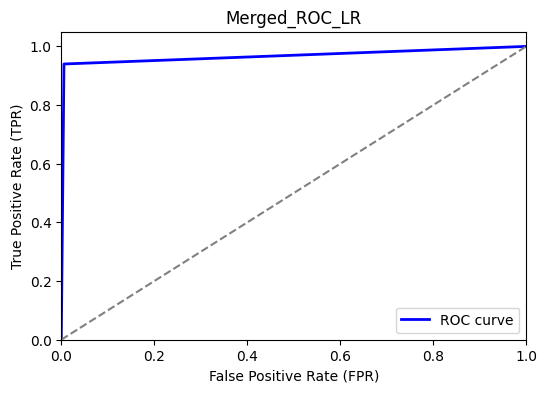

In [142]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Merged_ROC_LR')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Merged_ROC_LR_r6.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

---------------------**lime for Logistic Regression**---------------------

In [143]:
from lime.lime_text import LimeTextExplainer
class_names = list(train_df.label.unique())
explainer = LimeTextExplainer(class_names=class_names)

In [144]:
max_features = train_df.description.str.split().map(lambda x: len(x)).max()
print(max_features)

1744


In [145]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, lr)

In [146]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

675


In [147]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.7648122 0.2351878]]

Explanation as a list of weighted features


[('list', -0.0727392812023919),
 ('py', -0.05234614414255096),
 ('crash', 0.037435802612933146),
 ('browser', 0.032981637221213646),
 ('indexerror', -0.009322710855759801)]

In [148]:
[test.title.iloc[idx]]

['crash in setroubleshoot-server-2.2.83-1.fc13: browser.py:618:notify_button_clicked:indexerror: list index out of range']

In [149]:
exp.show_in_notebook(text=True)

In [150]:
# Naive Bayes Classifier
mnb = MultinomialNB()
mnb.fit(X_train_smote, y_train_smote)
y_train_pred = mnb.predict(X_train_smote)
y_test_pred = mnb.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=0.959, precision=0.999, recall=0.901, F1-Score=0.947, roc=0.95
Validation Scores: Accuracy=0.946, precision=0.994, recall=0.87, F1-Score=0.928, roc=0.933


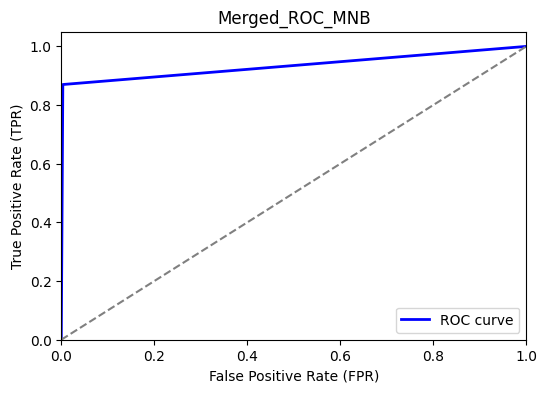

In [151]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Merged_ROC_MNB')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Merged_ROC_MNB_r6.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

----------------------------**lime for Naive Bayes**----------------------------

In [152]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, mnb)

In [153]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

675


In [154]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.90457784 0.09542216]]

Explanation as a list of weighted features


[('list', -0.08485534330973091),
 ('py', -0.03921960580743987),
 ('indexerror', -0.03251980106515417),
 ('crash', -0.030956009224923416),
 ('index', -0.02846145679968782)]

In [155]:
[test.title.iloc[idx]]

['crash in setroubleshoot-server-2.2.83-1.fc13: browser.py:618:notify_button_clicked:indexerror: list index out of range']

In [156]:
exp.show_in_notebook(text=True)

In [157]:
# Random Forest Classifier
rf = RandomForestClassifier()
rf.fit(X_train_smote, y_train_smote)
y_train_pred = rf.predict(X_train_smote)
y_test_pred = rf.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=1.0, precision=1.0, recall=1.0, F1-Score=1.0, roc=1.0
Validation Scores: Accuracy=0.972, precision=0.974, recall=0.955, F1-Score=0.965, roc=0.969


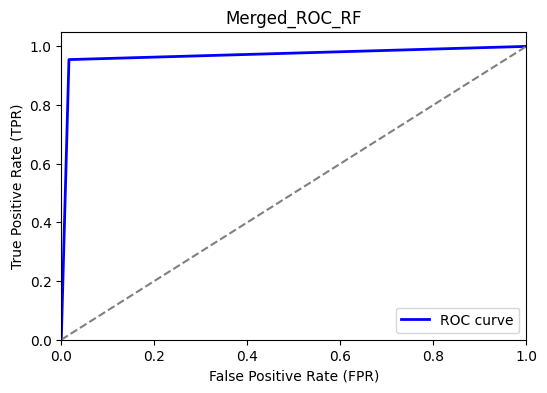

In [158]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Merged_ROC_RF')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Merged_ROC_RF_r6.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

----------------------**lime for Random Forest Classifier**---------------------

In [159]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, rf)

In [160]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

675


In [161]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.34 0.66]]

Explanation as a list of weighted features


[('list', -0.21069446243486528),
 ('crash', -0.06608648412277077),
 ('py', -0.02137315114105258),
 ('browser', 0.00844034234835426),
 ('index', -0.005061933998726499)]

In [162]:
[test.title.iloc[idx]]

['crash in setroubleshoot-server-2.2.83-1.fc13: browser.py:618:notify_button_clicked:indexerror: list index out of range']

In [163]:
exp.show_in_notebook(text=True)

In [164]:
# Extreme Gradient Boosting Classifier
xgb = XGBClassifier(objective='binary:logistic', eval_metric='logloss')
xgb.fit(X_train_smote, y_train_smote)
y_train_pred = xgb.predict(X_train_smote)
y_test_pred = xgb.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=0.996, precision=0.999, recall=0.991, F1-Score=0.995, roc=0.995
Validation Scores: Accuracy=0.973, precision=0.972, recall=0.959, F1-Score=0.965, roc=0.97


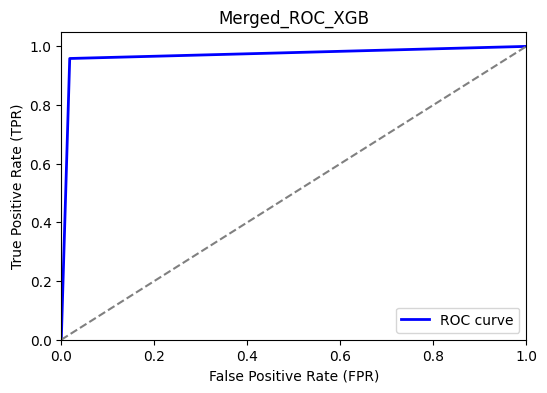

In [165]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Merged_ROC_XGB')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Merged_ROC_XGB_r6.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

---------------------**lime for Extreme Gradient Boosting**---------------------

In [166]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, xgb)

In [167]:
import random

random.seed(25)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.description.iloc[idx], pipe.predict_proba, num_features=5
)

1544


In [168]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.description.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.00121528 0.9987847 ]]

Explanation as a list of weighted features


[('attackers', 0.12133813713532335),
 ('references', 0.09686454459615233),
 ('was', 0.05445835180890355),
 ('reported', 0.041863184907254186),
 ('External', 0.02451818793444924)]

In [169]:
[test.description.iloc[idx]]

['It was reported that it is possible for remote unauthenticated attackers to cause the host to kill mongoDB service due to memory exhaustion This issue can be triggered by making multiple database creation requests Even if authentication fails the requested database is created in memory Eventually the host runs out of memory and kills Mongo service resulting in a denial of service After service restart all created databases are deleted The issue was identified in versions 24 and 26 The issue was found to be not reproducible on 3011 and 324 External references ']

In [170]:
explainer = LimeTextExplainer(class_names=['NSBR', 'SBR'])  # Adjust class_names as necessary

In [171]:
exp.show_in_notebook(text=True)

In [172]:
from IPython.display import display, HTML
exp_html = exp.as_html()

# Capture feature and value information
explanation_list = exp.as_list()
features_html = "<h2>Features and Values:</h2><ul>"
for feature, value in explanation_list:
    features_html += f"<li><strong>Feature:</strong> {feature}, <strong>Value:</strong> {value}</li>"
features_html += "</ul>"

# Combine LIME explanation and feature values into a single HTML
combined_html = f"{exp_html}<br>{features_html}"

# Display combined HTML in notebook
display(HTML(combined_html))

with open('lime_report.html', 'w') as file:
    file.write(combined_html)

# Now you have the HTML content saved to 'lime_report.html'
# Next, you can use a tool like wkhtmltoimage to convert HTML to image

# If you have wkhtmltoimage installed, you can use it like this:
!wkhtmltoimage --width 800 lime_report.html lime_report.png

/bin/bash: line 1: wkhtmltoimage: command not found
